In [7]:
#!unzip "drive/MyDrive/Dog_vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog_vision"

In [8]:
import tensorflow as tf
print(tf.__version__)

2.15.0


In [9]:
import tensorflow_hub as hub
print(hub.__version__)

0.16.1


In [10]:
print(tf.config.list_physical_devices)

<function list_physical_devices at 0x7a1b61dbf0a0>


In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Getting our data ready (turning into Tensors)

With all ML models, our data has to be in numarical format. So that's what we'll be doing first. Truning our images into Tensors (Numerical Represantation).



In [12]:
# Checkout the labels of our data

import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog_vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [13]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

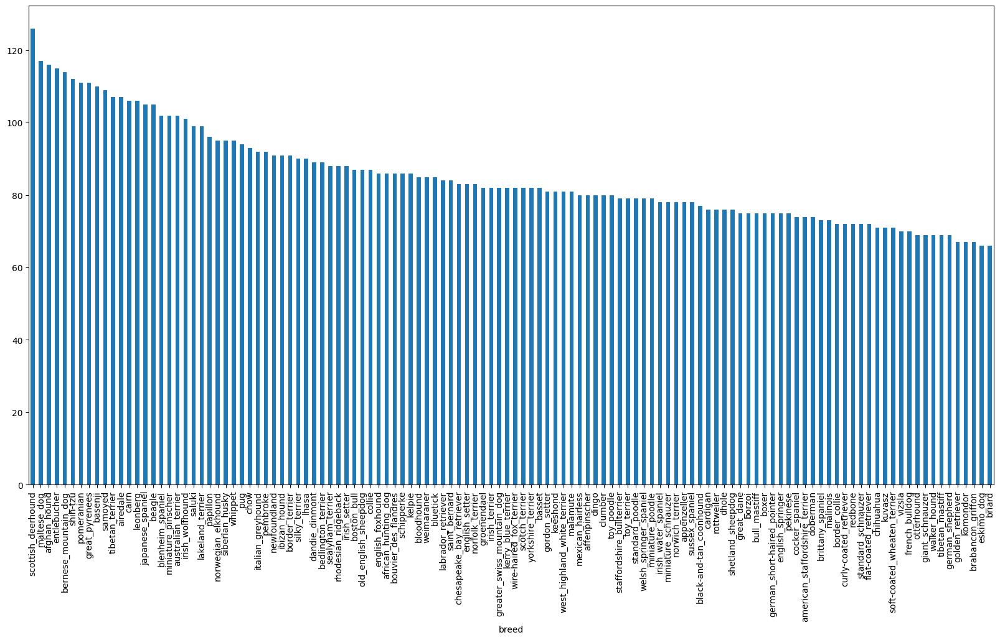

In [14]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [15]:
labels_csv["breed"].value_counts().median()

82.0

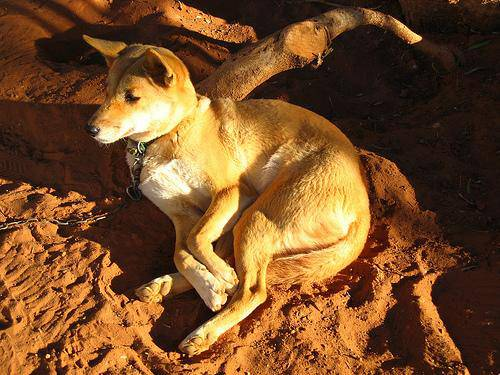

In [16]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames

In [17]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog_vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [18]:
import os
os.listdir("/content/drive/MyDrive/Dog_vision/train/")[:10] # provide list of img files

['eb64056a3ab7ac1e47bfde7c2e8bd518.jpg',
 'f485a9d5afe66b74092e8178f67d34c0.jpg',
 'f3f295d33149977b1d67b8a3b6484ea7.jpg',
 'f52e47ff39ef157d700d51d62bea79d0.jpg',
 'f61250c6e9263857befe7f256f9e909a.jpg',
 'ebb32c71dd92a3ad87d16006507fe779.jpg',
 'ecd2e5133a9dc2877d9d7d77581edb87.jpg',
 'f09536e93c84e70c1a6e144452ed98fb.jpg',
 'f50c3a2915a6744f66237534db3d7779.jpg',
 'ea8a9c29c83b5f3d4b917922a0ce9066.jpg']

In [19]:
# Check wether number of filenames matches number of actual image file

import os
if len(os.listdir("/content/drive/MyDrive/Dog_vision/train/")) == len(filenames):
  print("Filenames match actual amount of file.")
else:
  print("Filenames don't match actual amount of file")

Filenames match actual amount of file.


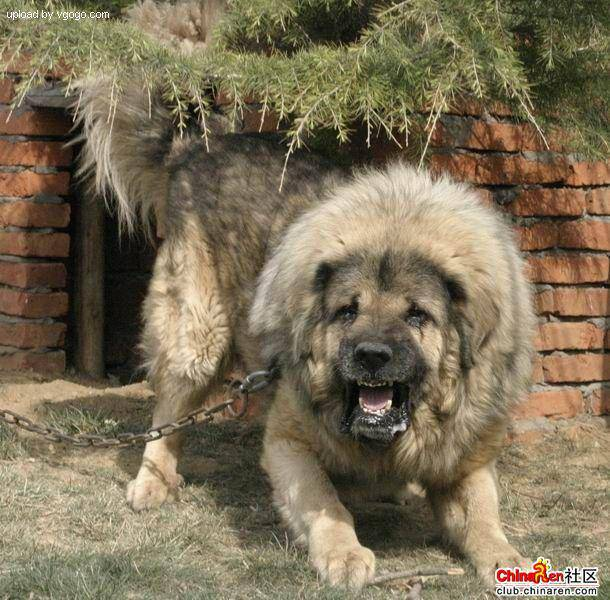

In [20]:
# One more check
Image(filenames[9000])

In [21]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [22]:
len(labels)

10222

In [23]:
# # See if number of lables matches the number of filenames
if len(labels) == len(filenames):
  print("Number of lablels matches number of filenames!")
else:
  print("Number of lablels does not match number of filenames")

Number of lablels matches number of filenames!


In [24]:
# Find the unique label values
unique_breeds = np.unique(labels)
print(unique_breeds)
len(unique_breeds)

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

120

In [25]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [26]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [27]:
# Example: Turning boolean array into integers

print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # Index where label occur
print(boolean_labels[0].argmax()) # Index where label occur boolean array
print(boolean_labels[0].astype(int)) # There will be 1 where sample label occur

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set


In [28]:
# Setup x and y variables
x = filenames
y = boolean_labels

In [29]:
len(filenames)

10222

In [30]:
# Set number of images to use for expirementing
NUM_IMAGES = 1000 #@param {type : "slider",min:1000,max:10000,step:1000}

In [31]:
# Let's spilt our data into train and validation sets
from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size = 0.2,random_state = 42)

len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [32]:
x_train[:10]

['/content/drive/MyDrive/Dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 '/content/drive/MyDrive/Dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 '/content/drive/MyDrive/Dog_vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 '/content/drive/MyDrive/Dog_vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 '/content/drive/MyDrive/Dog_vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 '/content/drive/MyDrive/Dog_vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 '/content/drive/MyDrive/Dog_vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 '/content/drive/MyDrive/Dog_vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 '/content/drive/MyDrive/Dog_vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 '/content/drive/MyDrive/Dog_vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [33]:
y_train[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Preprocessing images (Turning images into Tensors )

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, "iamge"
3. Turn image (a jpg) into tensors
4. Resize the image to be a shape of (224,224)
5. Return the modified the image



---



In [34]:
# Convert image to Numpy array

from matplotlib.pyplot import imread

In [35]:
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
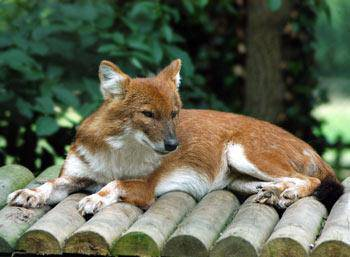

In [36]:
image

In [37]:
# Turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [38]:
# Define image size
IMG_SIZE = 224

# Create a function for preprossing images
def process_image(image_path,img_size = IMG_SIZE):
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Trun the jpeg image into numerical tensor with 3 color channel (R,G,B)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches
Batch size = 32 image

---




In [39]:
# Create a simple function to return a tuple (image,tuple)

def get_image_label(image_path,label):
  image = process_image(image_path)
  return image,label

In [40]:
# Demo of the above
(process_image(x[42],y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [41]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):

  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [42]:
# Creating training and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [43]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [44]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

### Visualizing Data Batches

In [45]:
import matplotlib.pyplot as plt

def show_25_images(images,labels):

  # Setup the figure
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [46]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels
len(train_images), len(train_labels)

(32, 32)

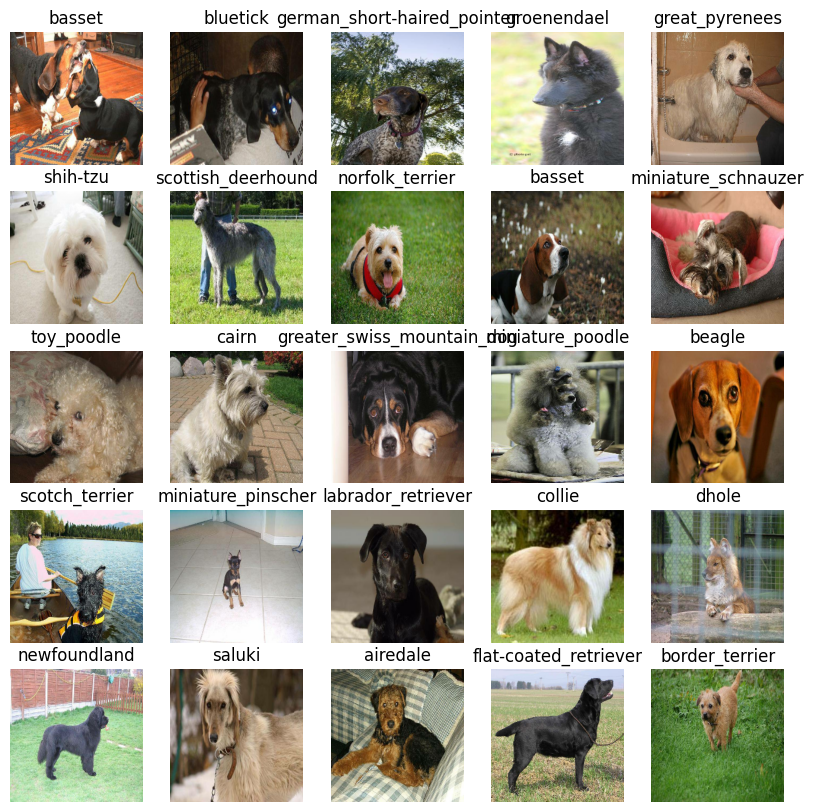

In [47]:
# Visualize
show_25_images(train_images,train_labels)

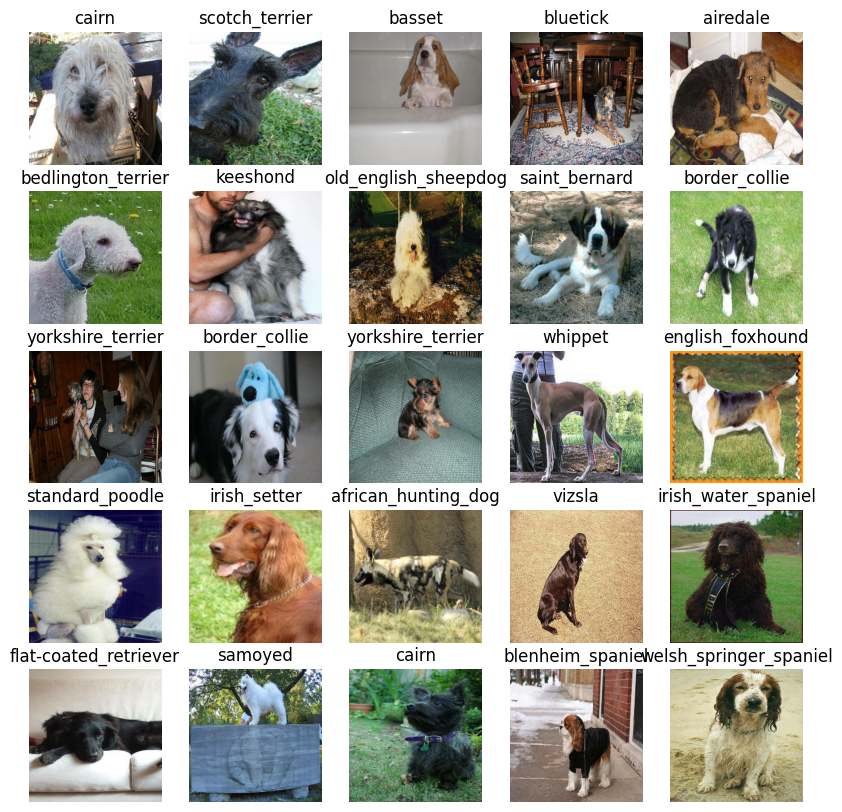

In [48]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [49]:
unique_breeds[y[0].argmax()]

'boston_bull'

## Building a model



In [50]:
# Setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model url from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"



In [51]:
# Create a function which builds a Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL),
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [52]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Create callbacks

In [53]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [54]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Dog_vision/logs",
                        datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

In [55]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)


## Training a model (on subset of data)
our first model is only going to train on 1000 images, to make sure everything is working

In [56]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [57]:
# Check to make sure we're still running on GPU
print("GPU","available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!!)


In [58]:
# Build a function to train and return a trained model
def train_model():
  # Create a model
  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [59]:
# # Fit the model to the data
# model = train_model()

### Checking the TensorBoard logs

In [60]:
%tensorboard --logdir /content/drive/MyDrive/Dog_vision/logs


<IPython.core.display.Javascript object>

In [61]:
# 245

## Making and evaluating predictions using trained model



In [62]:
# Make prediction on validation data
predictions = model.predict(val_data,
                           verbose=1 )
predictions

1/7 [===>..........................] - ETA: 19s

KeyboardInterrupt: 

In [ ]:
predictions.shape

In [ ]:
len(unique_breeds)

In [ ]:
# First prediction
index = 0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum : {np.sum(predictions)}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")
print(f"Max index : {np.argmax(predictions[index])}")

In [ ]:
 # Turn Prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[81])
pred_label

In [ ]:
val_data

In [ ]:
# Create a function to unbatch a batch dataset

def unbatchify(data):
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

In [ ]:
get_pred_label(val_labels[0])

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]


In [ ]:
get_pred_label(labels_[0])

In [ ]:
get_pred_label(predictions[0])

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n],images[n]

  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="gray")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Save model
def save_model(model,suffix=None):
  modeldif = os.path.join("/content/drive/MyDrive/Dog_vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldif + "_" + suffix + ".h5"
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# load a trained model
def load_model(model_path):
  print(f"Loading saved model from : {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")


In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog_vision/models/20240421-15111713712279_1000-images-mobilenetv2-Adam.h5")

In [ ]:
model.evaluate(val_data)

In [ ]:
loaded_1000_image_model.evaluate(val_data)

## Training a big dog model


In [ ]:
len(x), len(y)

In [ ]:
full_data = create_data_batches(x,y)


In [ ]:
full_data

In [ ]:
full_model = create_model()


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


In [ ]:
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard,full_model_early_stopping])

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

In [63]:
# Loading full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog_vision/models/20240421-16371713717422_full-image-set-mobilenetv2-Adam.h5")

Loading saved model from : /content/drive/MyDrive/Dog_vision/models/20240421-16371713717422_full-image-set-mobilenetv2-Adam.h5


## Making prediction on test set

In [65]:
test_path = "/content/drive/MyDrive/Dog_vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog_vision/test/fc405345f9ba08169e24ee81cc1fcaad.jpg',
 '/content/drive/MyDrive/Dog_vision/test/faaf9144e28a76de76ab05c59354f0fb.jpg',
 '/content/drive/MyDrive/Dog_vision/test/f7d9fb4125bb38adb9887b881aabda26.jpg',
 '/content/drive/MyDrive/Dog_vision/test/fac2dfeeb3d9687769744b1fcb81da07.jpg',
 '/content/drive/MyDrive/Dog_vision/test/ff28a67281fa0c35dc577ba62b16b73c.jpg',
 '/content/drive/MyDrive/Dog_vision/test/f9068d19af55c183e80afa192fcb0f85.jpg',
 '/content/drive/MyDrive/Dog_vision/test/fdd0bc9db54807ec3cb121827cf69061.jpg',
 '/content/drive/MyDrive/Dog_vision/test/fa541fc080cdeffb4dd98da99f673a59.jpg',
 '/content/drive/MyDrive/Dog_vision/test/fb0416a56859decbc1f5f6994687b16b.jpg',
 '/content/drive/MyDrive/Dog_vision/test/ffd87c3e44faa0e3ee5fbbdc4c63b59b.jpg']

In [66]:
len(test_filenames)

10357

In [67]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data = True)

Creating test data batches...


In [68]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [69]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 228s 705ms/step


In [70]:
np.savetxt("/content/drive/MyDrive/Dog_vision/pred_array.csv",test_predictions,delimiter=",")

In [72]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog_vision/pred_array.csv",delimiter=",")

In [73]:
test_predictions

array([[9.53888119e-13, 7.17928185e-15, 3.47826585e-13, ...,
        4.11699119e-09, 2.38955470e-12, 1.92336938e-10],
       [2.91787059e-04, 2.01666651e-07, 1.10057123e-07, ...,
        7.60437729e-07, 3.99843032e-07, 1.45154781e-05],
       [5.96804961e-09, 9.76771464e-09, 9.99683499e-01, ...,
        1.50564097e-06, 1.84371789e-11, 2.27070848e-10],
       ...,
       [1.63979622e-10, 3.48026902e-12, 1.85368821e-12, ...,
        1.58855784e-07, 1.76278384e-11, 1.23038579e-09],
       [2.16465823e-09, 1.57397189e-08, 1.13698810e-07, ...,
        4.55889722e-06, 1.36526412e-09, 8.18593104e-09],
       [1.49048573e-09, 3.27369243e-11, 1.75230233e-10, ...,
        4.68428803e-11, 9.38895755e-05, 5.79353355e-07]])